This notebook includes some additional plotting code for various figures used in the manuscript related to simple model activation values.

Accuracy: 95.60%
Confusion Matrix:
[[2470    0  102]
 [   0  774   13]
 [  74   15 1190]]


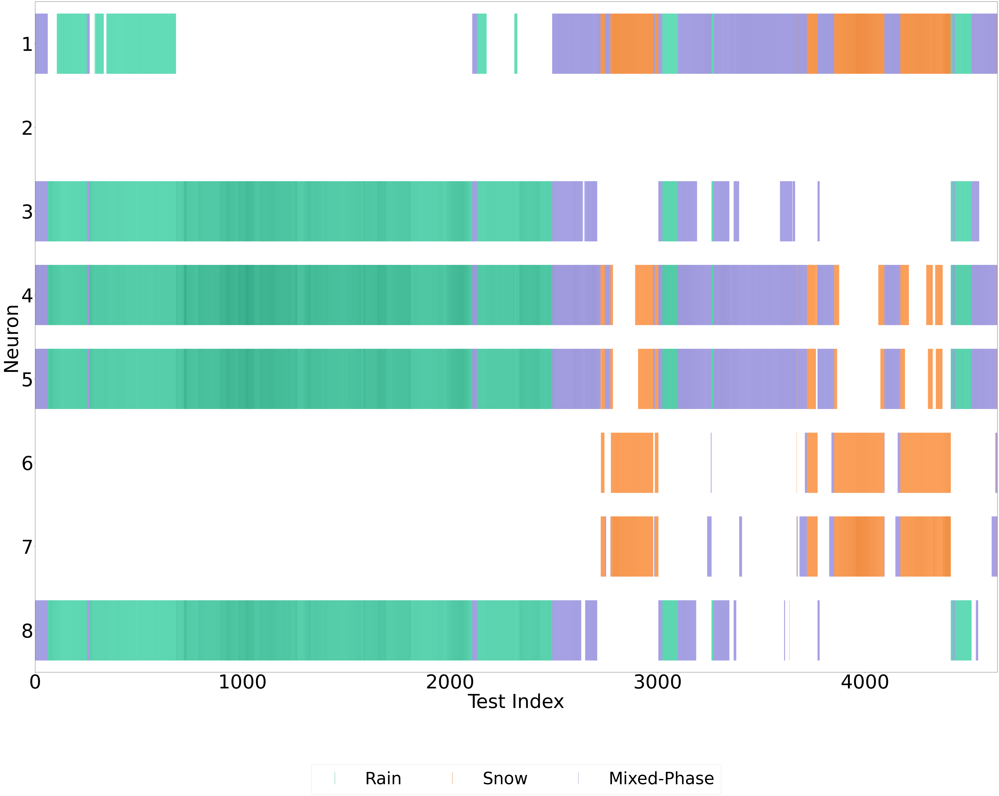

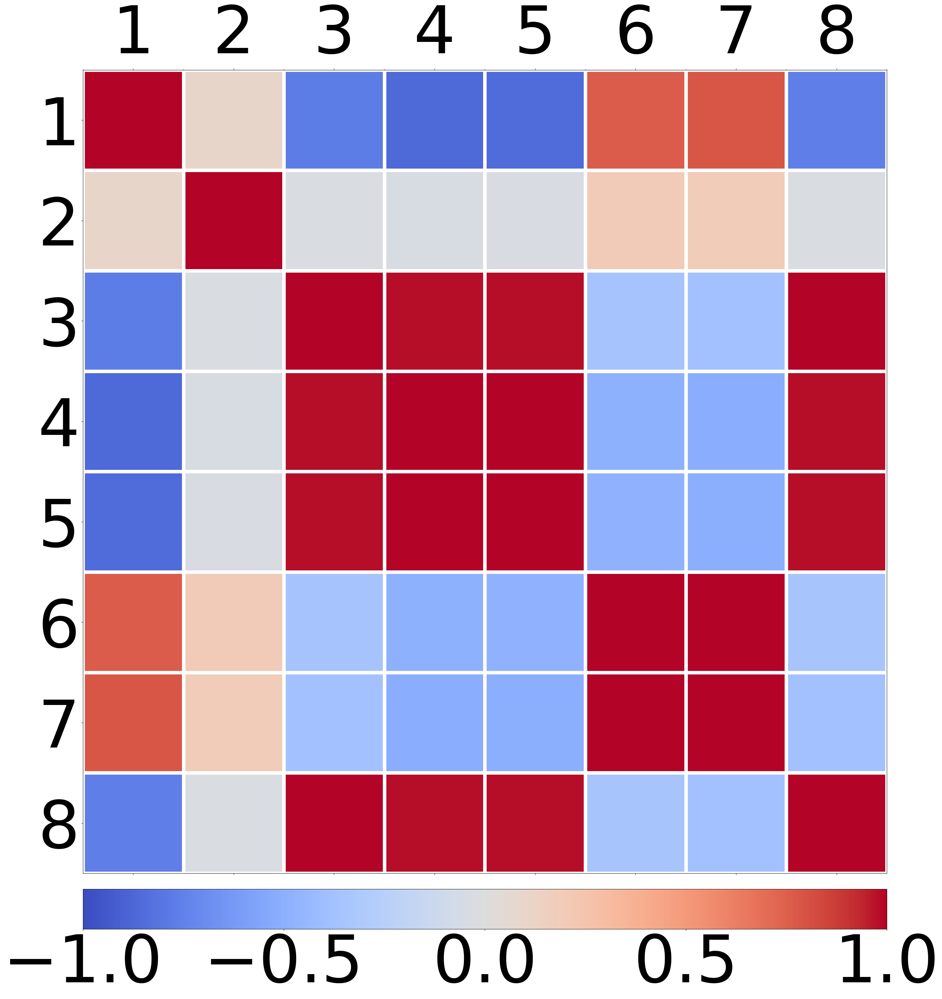

In [1]:
### Imports

import os
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.colors import to_rgb, LogNorm
from sklearn.metrics import confusion_matrix

### Below are a series of helper functions for plotting various visualizations/figures used throughout the paper
### Note that another pass needs to be done to improve formatting/code commenting

plt.rcParams.update({'font.size': 80})

def evaluate_model_and_plot(json_file_path, test_data_csv_path, standardize=False):
    with open(json_file_path, 'r') as f:
        data = json.load(f)

    weights = data['weights_history'][-1]
    biases = data['biases_history'][-1]

    W1 = np.array(weights[0])
    W2 = np.array(weights[1])
    b1 = np.array(biases[0])
    b2 = np.array(biases[1])

    W1 = W1.reshape(-1, data['N_HIDDEN'])
    b1 = b1.reshape(1, data['N_HIDDEN'])
    W2 = W2.reshape(data['N_HIDDEN'], -1)
    b2 = b2.reshape(1, -1)

    # Load test data
    test_data = pd.read_csv(test_data_csv_path)
    X_test = test_data['Temperature'].values.reshape(-1, 1)
    y_test = test_data['phase'].values

    if standardize:
        mean = data['scaling_info']['mean'][0]
        scale = data['scaling_info']['scale'][0]
        X_test = (X_test - mean) / scale

    def relu(x):
        return np.maximum(0, x)

    def softmax(x):
        exps = np.exp(x - np.max(x, axis=1, keepdims=True))
        return exps / np.sum(exps, axis=1, keepdims=True)

    def model_predict(X):
        z1 = np.dot(X, W1) + b1
        a1 = relu(z1)
        z2 = np.dot(a1, W2) + b2
        y_pred = softmax(z2)
        return y_pred, a1

    y_pred_probs, hidden_activations = model_predict(X_test)
    y_pred_labels = np.argmax(y_pred_probs, axis=1)

    accuracy = np.mean(y_pred_labels == y_test)
    print('Accuracy: {:.2%}'.format(accuracy))

    cm = confusion_matrix(y_test, y_pred_labels)
    print('Confusion Matrix:')
    print(cm)

    plot_activation_sparsity(hidden_activations, y_test)

    plot_activation_correlation_heatmap(hidden_activations)

def plot_activation_sparsity(activation_data, true_labels):
    epsilon = 0.01 
    num_samples, num_neurons = activation_data.shape

    # Prepare data for plotting
    plot_data = []
    activations_list = []
    for sample_index in range(num_samples):
        for neuron_index in range(num_neurons):
            activation = activation_data[sample_index, neuron_index]
            if activation > epsilon:
                activations_list.append(activation)
                plot_data.append({
                    'sample_index': sample_index,
                    'neuron_index': neuron_index,
                    'activation': activation,
                    'label': true_labels[sample_index]
                })

    activations_array = np.array(activations_list)
    max_activation = activations_array.max()

    # Avoid division by zero
    if max_activation == 0:
        max_activation = 1.0

    for data_point in plot_data:
        activation = data_point['activation']
        activation_norm = activation / max_activation
        data_point['activation_norm'] = activation_norm

    fig, ax = plt.subplots(figsize=(60, 48))
    base_colors_hex = ['#1b9e77', '#d95f02', '#7570b3']
    low_colors_hex = ['#51d9b0', '#fb9548', '#9c97e2']
    class_names = ['Rain', 'Snow', 'Mixed-Phase']

    from matplotlib.colors import to_rgb
    base_colors_rgb = [to_rgb(color) for color in base_colors_hex]
    low_colors_rgb = [to_rgb(color) for color in low_colors_hex]

    for data_point in plot_data:
        sample_index = data_point['sample_index']
        neuron_index = data_point['neuron_index']
        label = int(data_point['label'])
        activation_norm = data_point['activation_norm']

        low_color_rgb = low_colors_rgb[label]
        base_color_rgb = base_colors_rgb[label]
        blended_color_rgb = tuple(
            (1 - activation_norm) * low + activation_norm * base
            for low, base in zip(low_color_rgb, base_color_rgb)
        )

        ax.plot(sample_index, neuron_index, marker='|', markersize=250, color=blended_color_rgb)

    ax.set_xlabel('Test Index')
    ax.set_ylabel('Neuron')
    # ax.set_title('Activation Sparsity of Hidden Layer Neurons')
    ax.set_xlim(0, num_samples - 1)
    ax.set_ylim(-0.5, num_neurons - 0.5)
    ax.set_yticks(range(num_neurons))
    ax.set_yticklabels(range(1, num_neurons + 1))
    # ax.grid(True, which='both', linestyle='--', linewidth=0.5)

    from matplotlib.lines import Line2D
    legend_elements = [Line2D([0], [0], color=base_colors_hex[i], marker='|', linestyle='None',
                              markersize=50, label=class_names[i]) for i in range(len(class_names))]

    ax.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, -0.125), ncol=3, fontsize=70)
    plt.gca().invert_yaxis()

    plt.tight_layout()
    plt.show()


def plot_activation_correlation_heatmap(activation_data):
    import matplotlib.pyplot as plt
    from mpl_toolkits.axes_grid1 import make_axes_locatable

    plt.rcParams.update({'font.size': 150})

    correlation_matrix = np.corrcoef(activation_data, rowvar=False)

    fig, ax = plt.subplots(figsize=(36, 36))

    cax = ax.matshow(correlation_matrix, cmap='coolwarm', vmin=-1, vmax=1)

    num_neurons = activation_data.shape[1]
    ax.set_xticks(np.arange(-0.5, num_neurons, 1), minor=True)
    ax.set_yticks(np.arange(-0.5, num_neurons, 1), minor=True)
    ax.grid(which='minor', color='white', linestyle='-', linewidth=8)
    ax.tick_params(which='minor', bottom=False, left=False)

    ax.set_xticks(range(num_neurons))
    ax.set_yticks(range(num_neurons))
    ax.set_xticklabels([f'{i+1}' for i in range(num_neurons)], rotation=0)
    ax.set_yticklabels([f'{i+1}' for i in range(num_neurons)])

    divider = make_axes_locatable(ax)
    cbar_ax = divider.append_axes("bottom", size="5%", pad=0.5)
    fig.colorbar(cax, cax=cbar_ax, orientation='horizontal')

    cbar_ax.xaxis.set_ticks_position('bottom')
    cbar_ax.xaxis.set_label_position('bottom')
    # cbar_ax.tick_params(labelsize=100)  # Adjust tick label size if necessary

    plt.tight_layout()
    plt.show()


evaluate_model_and_plot('../models/model_Temperature_hidden_8_L1_off.json', '../data/test_data_classifier.csv', standardize=False)

Best model based on validation accuracy: model_n0_Rho_Dm_Temperature_Relative Humidity_hidden_4_L1_off.json
Worst model based on validation accuracy: model_n0_hidden_2_L1_on.json


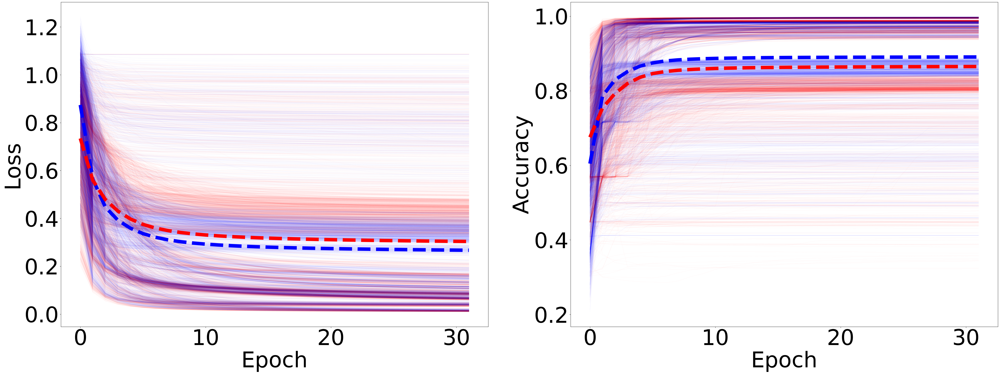

Best model based on validation mae: model_reflectivity_3_n0_lambda_t_16_rh_16_hidden_16_L1_off.json
Worst model based on validation mae: model_t_16_rh_15_hidden_2_L1_off.json


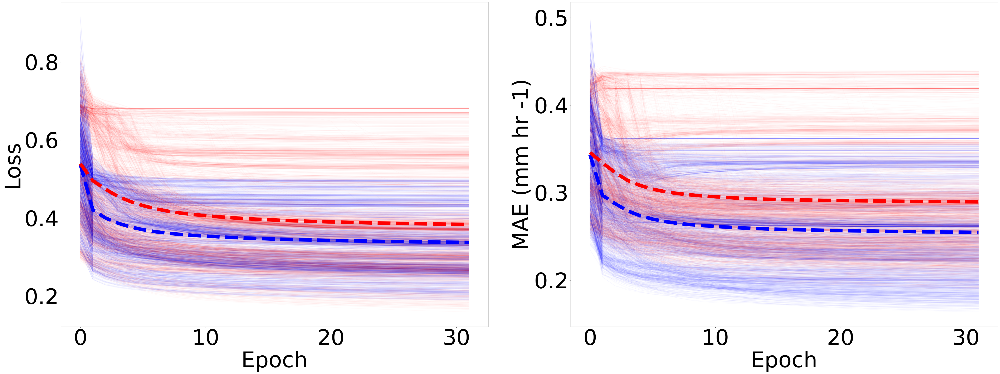

In [2]:
plt.rcParams.update({'font.size': 75})

def plot_histories(folder_path, metric='accuracy'):
    json_files = [file for file in os.listdir(folder_path) if file.endswith('.json')]

    loss_histories = []
    val_loss_histories = []
    metric_histories = []
    val_metric_histories = []

    final_val_losses = []
    final_val_metrics = []
    filenames = []

    max_length = 0

    for json_file in json_files:
        file_path = os.path.join(folder_path, json_file)
        with open(file_path, 'r') as f:
            data = json.load(f)
            loss_history = data.get('loss_history', [])
            val_loss_history = data.get('val_loss_history', [])

            if metric == 'accuracy':
                metric_history = data.get('accuracy_history', [])
                val_metric_history = data.get('val_accuracy_history', [])
            elif metric == 'mae':
                metric_history = data.get('mae_history', [])
                val_metric_history = data.get('val_mae_history', [])
            else:
                raise ValueError("Invalid metric. Must be 'accuracy' or 'mae'.")

            if loss_history and val_loss_history and metric_history and val_metric_history:
                max_length = max(max_length, len(loss_history), len(val_loss_history),
                                 len(metric_history), len(val_metric_history))

                loss_histories.append(loss_history)
                val_loss_histories.append(val_loss_history)
                metric_histories.append(metric_history)
                val_metric_histories.append(val_metric_history)

                final_val_loss = next((x for x in reversed(val_loss_history) if not np.isnan(x)), None)
                final_val_metric = next((x for x in reversed(val_metric_history) if not np.isnan(x)), None)

                final_val_losses.append(final_val_loss)
                final_val_metrics.append(final_val_metric)

                filenames.append(json_file)

    if not filenames:
        print("No valid JSON files with the required histories were found.")
        return

    def pad_history(history, length):
        padded = history + [np.nan] * (length - len(history))
        return padded

    loss_histories_padded = [pad_history(h, max_length) for h in loss_histories]
    val_loss_histories_padded = [pad_history(h, max_length) for h in val_loss_histories]
    metric_histories_padded = [pad_history(h, max_length) for h in metric_histories]
    val_metric_histories_padded = [pad_history(h, max_length) for h in val_metric_histories]

    loss_array = np.array(loss_histories_padded)
    val_loss_array = np.array(val_loss_histories_padded)
    metric_array = np.array(metric_histories_padded)
    val_metric_array = np.array(val_metric_histories_padded)

    mean_loss = np.nanmean(loss_array, axis=0)
    mean_val_loss = np.nanmean(val_loss_array, axis=0)
    mean_metric = np.nanmean(metric_array, axis=0)
    mean_val_metric = np.nanmean(val_metric_array, axis=0)

    final_val_metrics = np.array(final_val_metrics)
    final_val_losses = np.array(final_val_losses)

    if metric == 'accuracy':
        best_val_metric_idx = np.nanargmax(final_val_metrics)
        worst_val_metric_idx = np.nanargmin(final_val_metrics)
    elif metric == 'mae':
        best_val_metric_idx = np.nanargmin(final_val_metrics)
        worst_val_metric_idx = np.nanargmax(final_val_metrics)
    else:
        raise ValueError("Invalid metric. Must be 'accuracy' or 'mae'.")

    best_val_loss_idx = np.nanargmin(final_val_losses)
    worst_val_loss_idx = np.nanargmax(final_val_losses)

    print(f"Best model based on validation {metric}: {filenames[best_val_metric_idx]}")
    print(f"Worst model based on validation {metric}: {filenames[worst_val_metric_idx]}")

    fig, axs = plt.subplots(1, 2, figsize=(50, 20))

    line_alpha = 0.02

    c1 = 'blue'
    c2 = 'red'

    for idx, (loss, val_loss) in enumerate(zip(loss_histories, val_loss_histories)):
        axs[0].plot(loss, color=c1, alpha=line_alpha)
        axs[0].plot(val_loss, color=c2, alpha=line_alpha)

    # Plot mean loss and validation loss
    axs[0].plot(mean_loss, color=c1, linestyle='--', linewidth=12, label='Mean Loss')
    axs[0].plot(mean_val_loss, color=c2, linestyle='--', linewidth=12, label='Mean Validation Loss')

    axs[0].set_xlabel('Epoch')
    axs[0].set_ylabel('Loss')
    # axs[0].legend()

    for idx, (metric_vals, val_metric_vals) in enumerate(zip(metric_histories, val_metric_histories)):
        axs[1].plot(metric_vals, color=c1, alpha=line_alpha)
        axs[1].plot(val_metric_vals, color=c2, alpha=line_alpha)

    # Plot mean metric and validation metric
    axs[1].plot(mean_metric, color=c1, linestyle='--', linewidth=12, label='Mean Metric')
    axs[1].plot(mean_val_metric, color=c2, linestyle='--', linewidth=12, label='Mean Validation Metric')

    axs[1].set_xlabel('Epoch')
    label = 'Accuracy'
    if metric == 'mae':
        label = 'MAE (mm hr -1)'
    axs[1].set_ylabel(label)
    # axs[1].legend()

    plt.tight_layout()
    plt.show()

plot_histories('/Users/fraserking/Development/nn_inspector/models/classifier/', metric='accuracy')
plot_histories('/Users/fraserking/Development/nn_inspector/models/regressor/', metric='mae')

Accuracy: 99.72%
Confusion Matrix:
[[2569    0    3]
 [   0  782    5]
 [   1    4 1274]]


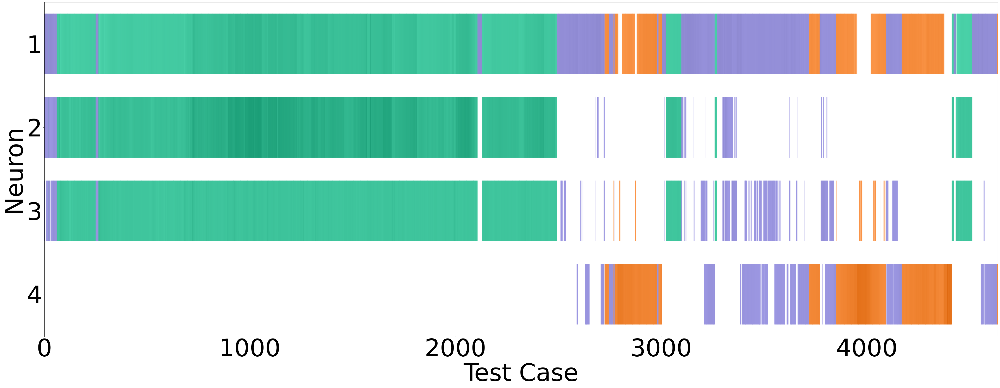

In [3]:
plt.rcParams.update({'font.size': 80})

# TODO: This plotting function should be generalized
def evaluate_model_and_plot(json_file_path, test_data_csv_path, feature_names, standardize=False):
    with open(json_file_path, 'r') as f:
        data = json.load(f)

    weights = data['weights_history'][-1]
    biases = data['biases_history'][-1]

    W1 = np.array(weights[0])
    W2 = np.array(weights[1])
    b1 = np.array(biases[0])
    b2 = np.array(biases[1])

    input_dim = len(feature_names)
    N_HIDDEN = data['N_HIDDEN']
    W1 = W1.reshape(input_dim, N_HIDDEN)
    b1 = b1.reshape(1, N_HIDDEN)
    W2 = W2.reshape(N_HIDDEN, -1)
    b2 = b2.reshape(1, -1)

    test_data = pd.read_csv(test_data_csv_path)
    X_test = test_data[feature_names].values
    y_test = test_data['phase'].values

    if standardize:
        mean = np.array(data['scaling_info']['mean'])
        scale = np.array(data['scaling_info']['scale'])
        X_test = (X_test - mean) / scale

    def relu(x):
        return np.maximum(0, x)

    def softmax(x):
        exps = np.exp(x - np.max(x, axis=1, keepdims=True))
        return exps / np.sum(exps, axis=1, keepdims=True)

    def model_predict(X):
        z1 = np.dot(X, W1) + b1
        a1 = relu(z1)
        z2 = np.dot(a1, W2) + b2
        y_pred = softmax(z2)
        return y_pred, a1

    y_pred_probs, hidden_activations = model_predict(X_test)
    y_pred_labels = np.argmax(y_pred_probs, axis=1)

    accuracy = np.mean(y_pred_labels == y_test)
    print('Accuracy: {:.2%}'.format(accuracy))

    cm = confusion_matrix(y_test, y_pred_labels)
    print('Confusion Matrix:')
    print(cm)

    plot_activation_sparsity(hidden_activations, y_test)

def plot_activation_sparsity(activation_data, true_labels):
    epsilon = 0.01
    num_samples, num_neurons = activation_data.shape

    plot_data = []
    activations_list = []
    for sample_index in range(num_samples):
        for neuron_index in range(num_neurons):
            activation = activation_data[sample_index, neuron_index]
            if activation > epsilon:
                activations_list.append(activation)
                plot_data.append({
                    'sample_index': sample_index,
                    'neuron_index': neuron_index,
                    'activation': activation,
                    'label': true_labels[sample_index]
                })

    activations_array = np.array(activations_list)
    max_activation = activations_array.max()

    if max_activation == 0:
        max_activation = 1.0

    for data_point in plot_data:
        activation = data_point['activation']
        activation_norm = activation / max_activation
        data_point['activation_norm'] = activation_norm

    fig, ax = plt.subplots(figsize=(48, 20))
    base_colors_hex = ['#1b9e77', '#d95f02', '#7570b3']  # Original base colors for Rain, Snow, Mixed-Phase
    # Low colors for low activations
    low_colors_hex = ['#51d9b0', '#fb9548', '#9c97e2']
    class_names = ['Rain', 'Snow', 'Mixed-Phase']

    base_colors_rgb = [to_rgb(color) for color in base_colors_hex]
    low_colors_rgb = [to_rgb(color) for color in low_colors_hex]

    for data_point in plot_data:
        sample_index = data_point['sample_index']
        neuron_index = data_point['neuron_index']
        label = int(data_point['label'])
        activation_norm = data_point['activation_norm']

        low_color_rgb = low_colors_rgb[label]
        base_color_rgb = base_colors_rgb[label]
        blended_color_rgb = tuple(
            (1 - activation_norm) * low + activation_norm * base
            for low, base in zip(low_color_rgb, base_color_rgb)
        )

        ax.plot(sample_index, neuron_index, marker='|', markersize=200, color=blended_color_rgb)

    ax.set_xlabel('Test Case')
    ax.set_ylabel('Neuron')
    ax.set_xlim(0, num_samples - 1)
    ax.set_ylim(-0.5, num_neurons - 0.5)
    ax.set_yticks(range(num_neurons))
    ax.set_yticklabels(range(1, num_neurons + 1))
    plt.gca().invert_yaxis()

    plt.tight_layout()
    plt.savefig('/Users/fraserking/Desktop/asd.png', transparent=True)


feature_names = ['n0', 'Rho', 'Dm', 'Temperature', 'Relative Humidity']
evaluate_model_and_plot(
    '../models/model_n0_Rho_Dm_Temperature_Relative Humidity_hidden_4_L1_off.json',
    '../data/test_data_classifier.csv',
    feature_names,
    standardize=False
)

Response variable contains zero or negative values. Shifted by 0.0000 for log scale.
2.0000000000000003e-06 9.703482000000001


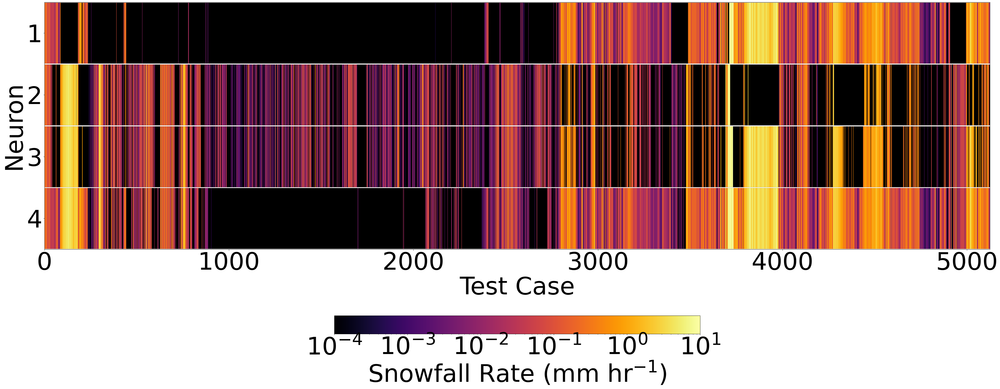

In [4]:
plt.rcParams.update({'font.size': 80})

# TODO: Generalize this as well
def evaluate_model_and_plot(json_file_path, test_data_csv_path, feature_names, response_name, standardize=False):
    with open(json_file_path, 'r') as f:
        data = json.load(f)

    weights = data['weights_history'][-1]
    biases = data['biases_history'][-1]

    W1 = np.array(weights[0])
    W2 = np.array(weights[1])
    b1 = np.array(biases[0])
    b2 = np.array(biases[1])

    input_dim = len(feature_names)
    N_HIDDEN = data['N_HIDDEN']
    W1 = W1.reshape(input_dim, N_HIDDEN)
    b1 = b1.reshape(1, N_HIDDEN)
    W2 = W2.reshape(N_HIDDEN, -1)
    b2 = b2.reshape(1, -1)

    test_data = pd.read_csv(test_data_csv_path)
    X_test = test_data[feature_names].values
    y_test = test_data[response_name].values

    if standardize:
        mean = np.array(data['scaling_info']['mean'])
        scale = np.array(data['scaling_info']['scale'])
        X_test = (X_test - mean) / scale

    def relu(x):
        return np.maximum(0, x)

    def model_predict(X):
        z1 = np.dot(X, W1) + b1
        a1 = relu(z1)
        z2 = np.dot(a1, W2) + b2
        y_pred = z2
        return y_pred, a1

    y_pred, hidden_activations = model_predict(X_test)

    # mae = mean_absolute_error(y_test, y_pred.flatten())
    # print('Mean Absolute Error: {:.4f}'.format(mae))

    plot_activation_sparsity(hidden_activations, y_test, response_name)

def plot_activation_sparsity(activation_data, true_values, response_name):
    epsilon = 0.01 
    num_samples, num_neurons = activation_data.shape

    plot_data = []
    activations_list = []
    for sample_index in range(num_samples):
        for neuron_index in range(num_neurons):
            activation = activation_data[sample_index, neuron_index]
            if activation > epsilon:
                activations_list.append(activation)
                plot_data.append({
                    'sample_index': sample_index,
                    'neuron_index': neuron_index,
                    'activation': activation,
                    'response': true_values[sample_index]
                })

    response_array = np.array([data_point['response'] for data_point in plot_data])

    if np.any(response_array <= 0):
        min_positive = response_array[response_array > 0].min()
        shift = min_positive / 10
        response_array_shifted = response_array + shift
        print(f"Response variable contains zero or negative values. Shifted by {shift:.4f} for log scale.")
    else:
        shift = 0
        response_array_shifted = response_array

    fig, ax = plt.subplots(figsize=(48, 20))
    cmap = plt.get_cmap('inferno')

    print(response_array_shifted.min(), response_array_shifted.max())

    norm = LogNorm(vmin=0.0001, vmax=10)
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])

    for i in range(sample_index):
        for n in range(num_neurons):
            ax.plot(i, n, marker='|', markersize=200, color='black')

    for data_point in plot_data:
        sample_index = data_point['sample_index']
        neuron_index = data_point['neuron_index']
        response_value = data_point['response'] + shift

        color = cmap(norm(response_value))

        ax.plot(sample_index, neuron_index, marker='|', markersize=200, color=color)

    ax.set_xlabel('Test Case')
    ax.set_ylabel('Neuron')
    ax.set_xlim(0, num_samples - 1)
    ax.set_ylim(-0.5, num_neurons - 0.5)
    ax.set_yticks(range(num_neurons))
    ax.set_yticklabels(range(1, num_neurons + 1))
    plt.gca().invert_yaxis()

    cbar = plt.colorbar(sm, ax=ax, orientation='horizontal', fraction=0.055, pad=0.2)
    cbar.set_label('Snowfall Rate (mm hr$^{-1}$)')

    # # Add colorbar with logarithmic scale
    # cbar = plt.colorbar(sm, ax=ax)
    # cbar.set_label(response_name)

    plt.tight_layout()
    plt.savefig('/Users/fraserking/Desktop/asd2.png', transparent=True)


feature_names = ['reflectivity_3', 'reflectivity_4', 'n0', 'lambda', 't_15']
evaluate_model_and_plot(
    '../models/model_reflectivity_3_reflectivity_4_n0_lambda_t_15_hidden_4_L1_off.json',
    '../data/test_data_regressor.csv',
    feature_names,
    'Sr',
    standardize=False
)

In [5]:
print("Execution complete!")

Execution complete!
